
# **<center><font style="color:rgb(100,109,254)">Human Sports Recognition in Videos using Keras (CNN + LSTM)</font> </center>**

<center>
<img src='https://c.tenor.com/iLYPmFMHM_0AAAAi/dunk-de-rozan.gif'></center>

### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**

We will start by installing and importing the required libraries.

In [1]:
# Discard the output of this cell.
#%%capture

# Install the required libraries.
# to download the youtube videos which we can use duting final testing
!pip install tensorflow opencv-contrib-python pafy youtube-dl moviepy pydot

In [2]:
# Import the required libraries.
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
import pandas as pd

from moviepy.editor import * 
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *

#while training we might use the sequential, to_categorial, earlystopping libraries from keras

And will set `Numpy`, `Python`, and `Tensorflow` seeds to get consistent results on every execution.

In [3]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

## **<font style="color:rgb(134,19,348)">Step 1: Visualize the Data with its Labels</font>**

In the first step, we will visualize the data along with labels to get an idea about what we will be dealing with. We will be using the [UCF50 - Action Recognition Dataset](https://www.crcv.ucf.edu/data/UCF50.php), consisting of realistic videos taken from youtube which differentiates this data set from most of the other available action recognition data sets as they are not realistic and are staged by actors. The Dataset contains:

*   **`50`** Action Categories from that we will be using **`3`** categories

*   **`133`** Average Videos per Action Category

*   **`199`** Average Number of Frames per Video

*   **`320`** Average Frames Width per Video

*   **`240`** Average Frames Height per Video

*   **`29`** Average Frames Per Seconds per Video

For visualization, we will pick `3` categories from the dataset and a video from each selected category and will visualize the first frame of the selected videos with their associated labels written. 

## **<font style="color:rgb(134,19,348)">Step 2: Preprocess the Dataset</font>**

Next, we will perform some preprocessing on the dataset. First, we will read the video files from the dataset and resize the frames of the videos to a fixed width and height, to reduce the computations and normalized the data to range `[0-1]` by dividing the pixel values with `255`, which makes learning faster by decreasing the model's training time. In normalization basically the too giht and too low problems would be solved. basicaly contrast issues



In [4]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 40

# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "DATASET"

# Specify the list containing the names of the classes used for training.
CLASSES_LIST = ["Baseball", "Basketball", "Volleyball"]

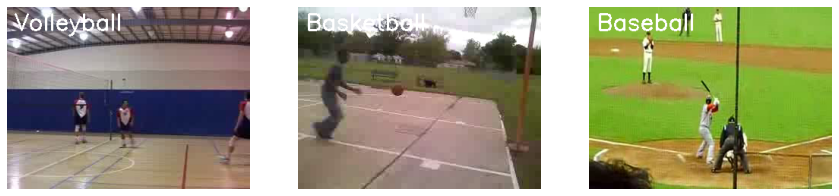

In [5]:
plt.figure(figsize = (20, 20))

all_classes_names = os.listdir('DATASET')

random_range = random.sample(range(len(all_classes_names)), 3)

# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):

    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]

    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'DATASET/{selected_class_Name}')

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'DATASET/{selected_class_Name}/{selected_video_file_name}')
    
    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()

    # Release the VideoCapture object. 
    video_reader.release()

    # Convert the frame from BGR into RGB format because image processing library follow a certain pixel order. 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    # Display the frame.
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')


In [6]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []
    
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Release the VideoCapture object. 
    video_reader.release()

    # Return the frames list.
    return frames_list

In [7]:
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

### **<font style="color:rgb(134,19,348)">Create a Function for Dataset Creation</font>**

Now we will create a function **`create_dataset()`** that will iterate through all the classes specified in the **`CLASSES_LIST`** constant and will call the function  **`frame_extraction()`** on every video file of the selected classes and return the frames (**`features`**), class index ( **`labels`**), and video file path (**`video_files_paths`**).


    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    

In [8]:
def create_dataset():


    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
    
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

In [9]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: Baseball
Extracting Data of Class: Basketball
Extracting Data of Class: Volleyball


In [10]:
from tensorflow.keras.utils import to_categorical
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
# Basically converting categorial data variables into numerical values which helps improve the predictions ad classification accuracy
one_hot_encoded_labels = to_categorical(labels)

In [11]:
print(one_hot_encoded_labels)

[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 ...
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 0. 1.]]


In [12]:
pip install fast_ml

Note: you may need to restart the kernel to use updated packages.


from fast_ml.model_development import train_valid_test_split
features_train, labels_train, labels_valid, features_valid, features_test, labels_test,  = train_valid_test_split(features, one_hot_encoded_labels,
                                                                                                                  test_size = 0.1, train_size=0.8, valid_size=0.1,random_state = seed_constant)

In [13]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True,
                                                                            random_state = seed_constant)

# Model description
To implement our LRCN architecture, we will use time-distributed Conv2D layers which will be followed by MaxPooling2D and Dropout layers. The feature extracted from the Conv2D layers will be then flattened using the Flatten layer and will be fed to a LSTM layer. The Dense layer with softmax activation will then use the output from the LSTM layer to predict the action being performed.

### padding
In order to assist the kernel with processing the image, padding is added to the frame of the image to allow for more space for the kernel to cover the image. Adding padding to an image processed by a CNN allows for more accurate analysis of images.
SAME Padding: it applies padding to the input image so that the input image gets fully covered by the filter and specified stride.It is called SAME because, for stride 1 , the output will be the same as the input.


### Activations
The choice of activation function in the hidden layer will control how well the network model learns the training dataset. The choice of activation function in the output layer will define the type of predictions the model can make.

Why we decided on RELU activation for the filters:- A hidden layer in a neural network is a layer that receives input from another layer (such as another hidden layer or an input layer) and provides output to another layer (such as another hidden layer or an output layer).

Why we decided on SOFTMAX activation for the filters:- For output layer and for probability purpose. Also since the problem type is multiclass classification

In [14]:
# Time distributed layer working with sequence of image layers and we want everything to the applied on all the images

# Conv2D :- for feature extraction
#


def create_LRCN_model():
    model = Sequential()
    

#1st Conv2d cell or feature map is formed for with 16 filers for feature learning
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
#With the pooling layer downsize the input samples so the model can also get a wider perspective 
#and the computation becaomes easy basically it will be downsampling by taking maximum value over the imput window  
# by default here rn stride is 1,1
    model.add(TimeDistributed(MaxPooling2D((4, 4)))) 
    #to reduce dependancy on certain key points and then we can look at the model as a whole
    #thus we will know exactly how much accurately the values are being read
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    #kernel size = 3,3
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    #With more the filers more the feature maps and better the result
    
    #combine all the the feature maps layer and flatten it into one layer 
    model.add(TimeDistributed(Flatten(input_shape=(32,32,3))))#global average layer??
    
    #model.add(Flatten(input_shape=(32,32,3)) # 32*32*3 = 3072
                                      
    #feeding the flattened feature map to LSTM model 
    model.add(LSTM(32)) #32 untis i.e 32 layers of neurons(on the lstm layer)
           
    #class probability distributed aganist all 3 classes fo softmax
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))


    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model

In [15]:
# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 40, 64, 64, 16)   448       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 40, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 40, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 40, 16, 16, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 40, 4, 4, 32)     0

In [16]:
 pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [17]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


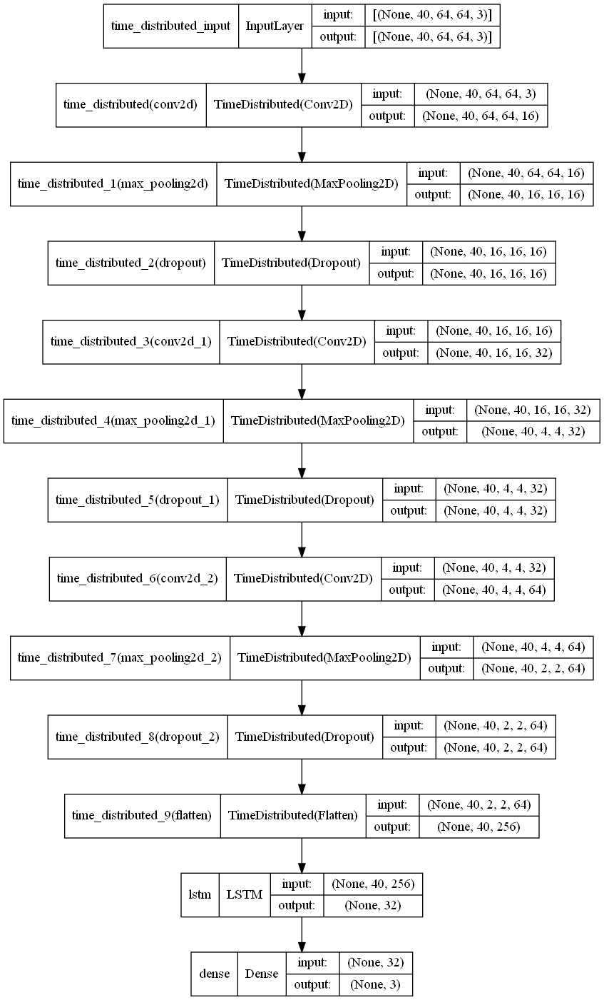

In [18]:
plot_model(LRCN_model, to_file = 'LRCN_model_structure_plot.png', show_shapes = True, show_layer_names = True)

Early stopping is used to stop overfitting and over training of the model
patience:- the number of epochs to wait before early stop if no progress on the validation set.
adam:- The method is really efficient when working with large problem involving a lot of data or parameters. 

In [19]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics to the model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCN_model_training_history = LRCN_model.fit(features_train, labels_train, epochs = 30, batch_size = 4,
                                            shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

#model.fit_generator( generator=training_set, validation_data=testing_set, verbose=1, callbacks=callbacks, epochs=120 )

Epoch 1/30
61/61 [==============================] - 24s 331ms/step - loss: 1.1210 - accuracy: 0.3278 - val_loss: 1.0942 - val_accuracy: 0.3443
Epoch 2/30
61/61 [==============================] - 18s 301ms/step - loss: 1.0842 - accuracy: 0.4108 - val_loss: 1.0766 - val_accuracy: 0.3443
Epoch 3/30
61/61 [==============================] - 18s 302ms/step - loss: 1.0683 - accuracy: 0.3942 - val_loss: 1.0442 - val_accuracy: 0.4754
Epoch 4/30
61/61 [==============================] - 19s 307ms/step - loss: 0.9457 - accuracy: 0.5353 - val_loss: 0.9788 - val_accuracy: 0.4754
Epoch 5/30
61/61 [==============================] - 19s 313ms/step - loss: 0.8566 - accuracy: 0.6100 - val_loss: 0.8715 - val_accuracy: 0.5082
Epoch 6/30
61/61 [==============================] - 19s 310ms/step - loss: 0.7412 - accuracy: 0.6556 - val_loss: 1.0306 - val_accuracy: 0.5574
Epoch 7/30
61/61 [==============================] - 19s 305ms/step - loss: 0.6785 - accuracy: 0.6888 - val_loss: 0.8018 - val_accuracy: 0.7213

In [20]:
hist_df = pd.DataFrame(LRCN_model_training_history.history)

In [21]:
hist_csv_file = 'history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [22]:
# Evaluate the trained model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

4/4 [==============================] - 2s 544ms/step - loss: 0.2050 - accuracy: 0.9604


In [23]:
 # Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
    
# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save the Model.
LRCN_model.save(model_file_name)

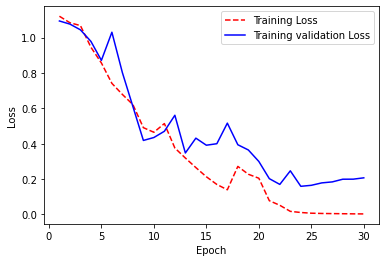

In [24]:
# Get training and test loss histories
training_loss = LRCN_model_training_history.history['loss']
val_loss = LRCN_model_training_history.history['val_loss']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Training validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

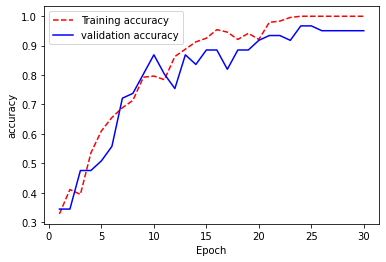

In [25]:
# Get training and test loss histories
training_accuracy = LRCN_model_training_history.history['accuracy']
val_accuracy = LRCN_model_training_history.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_accuracy, 'r--')
plt.plot(epoch_count, val_accuracy, 'b-')
plt.legend(['Training accuracy', 'validation accuracy'])
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.show();

In [26]:
#plot the training process graph
#confusion matrix for testing (predicted vs actual labels) true positive wala

#calculate:- precision, recall, sensitivity, specificity, AUC
#architechture of model ---- done

#youtube videos testing,

#vary one parameter at once and remiining fixed
#vary epochs and batch size
# patience info needed 
#learning rate in model training by default

In [27]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [28]:
yhat = LRCN_model.predict(features_test)

In [29]:
predictions_value = np.argmax(yhat, axis=1)

In [30]:
predictions_value

array([2, 1, 1, 0, 2, 0, 2, 0, 1, 0, 0, 2, 0, 0, 1, 1, 2, 2, 1, 1, 1, 0,
       0, 2, 2, 2, 0, 0, 2, 1, 1, 1, 1, 2, 0, 2, 1, 2, 1, 2, 0, 1, 0, 0,
       1, 2, 0, 0, 1, 0, 1, 0, 1, 2, 0, 1, 0, 2, 2, 1, 2, 2, 2, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 2, 1, 0, 0, 2, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 0, 2, 2, 0, 2, 2, 1, 1, 2, 2, 2], dtype=int64)

In [31]:
ytrue = np.argmax(labels_test, axis=1).tolist()

In [32]:
confusion_matrix(ytrue, predictions_value)

array([[38,  1,  0],
       [ 1, 29,  1],
       [ 1,  0, 30]], dtype=int64)

In [33]:
from sklearn import metrics

print("precision = ",metrics.precision_score(ytrue,predictions_value, average='macro'))
print("recall = ",metrics.recall_score(ytrue,predictions_value, average='micro'))
print("f1 score = ",metrics.f1_score(ytrue,predictions_value, average='weighted'))


precision =  0.9614695340501792
recall =  0.9603960396039604
f1 score =  0.9603405661172052


In [34]:
#category-wise accuracy
from sklearn.metrics import confusion_matrix
import numpy as np
target_names = ["Baseball", "Basketball", "Volleyball"]
cm = confusion_matrix(ytrue, predictions_value)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
cm.diagonal()

array([0.97435897, 0.93548387, 0.96774194])

In [35]:
from sklearn.metrics import classification_report
print(classification_report(ytrue,predictions_value , target_names=target_names, digits=4))

              precision    recall  f1-score   support

    Baseball     0.9500    0.9744    0.9620        39
  Basketball     0.9667    0.9355    0.9508        31
  Volleyball     0.9677    0.9677    0.9677        31

    accuracy                         0.9604       101
   macro avg     0.9615    0.9592    0.9602       101
weighted avg     0.9606    0.9604    0.9603       101



# Testing

In [37]:
def download_youtube_videos(youtube_video_url, output_directory):
    
 
     # Create a video object which contains useful information about the video.
     video = pafy.new(youtube_video_url)
 
     # Retrieve the title of the video.
     title = video.title
 
     # Get the best available quality object for the video.
     video_best = video.getbest()
 
     # Construct the output file path.
     output_file_path = f'{output_directory}/{title}.mp4'
 
     # Download the youtube video at the best available quality and store it to the contructed path.
     video_best.download(filepath = output_file_path, quiet = True)
 
     # Return the video title.
     return title

In [38]:
# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)

# Download a YouTube Video.
video_title = download_youtube_videos('https://www.youtube.com/watch?v=y9zke7hB2mc', test_videos_directory)

# Get the YouTube Video's path we just downloaded.
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

In [39]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
   

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read() 
        
        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)
        
    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [40]:
# Construct the output video path.
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [41]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read() 

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    # Release the VideoCapture object. 
    video_reader.release()

In [42]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/watch?v=Ow1dhNw-Dqk', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


Action Predicted: Volleyball
Confidence: 0.9916785955429077
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [43]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/watch?v=SA4PiIyvGVI', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


Action Predicted: Basketball
Confidence: 0.9973702430725098
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [44]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/watch?v=F6qXp6UPw1Y', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


Action Predicted: Basketball
Confidence: 0.9961428046226501
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [48]:
from sklearn.metrics import confusion_matrix
y_actu = ["basketball","volleyball","baseball", "volleyball", "volleyball", "volleyball","volleyball","volleyball", "volleyball","baseball","baseball", "baseball","baseball","baseball","baseball","basketball","basketball","basketball","basketball","basketball","basketball","basketball","volleyball","baseball"]
y_pred = ["volleyball","volleyball","baseball", "baseball","baseball", "volleyball","volleyball","baseball","volleyball", "baseball","basketball","baseball","baseball","baseball","baseball","volleyball", "basketball", "basketball","volleyball", "basketball", "basketball","volleyball","volleyball","baseball"]
confusion_matrix(y_actu, y_pred)

array([[7, 1, 0],
       [0, 4, 4],
       [3, 0, 5]], dtype=int64)

In [49]:
from sklearn import metrics

print("precision = ",metrics.precision_score(y_actu, y_pred, average='macro'))
print("recall = ",metrics.recall_score(y_actu, y_pred, average='micro'))
print("f1 score = ",metrics.f1_score(y_actu, y_pred, average='weighted'))

precision =  0.6851851851851851
recall =  0.6666666666666666
f1 score =  0.6604658957600135


In [50]:
print("accuracy = ",accuracy_score(y_actu, y_pred)*100)

accuracy =  66.66666666666666


In [51]:
from sklearn.metrics import confusion_matrix

import numpy as np

target_names = ["Baseball", "Basketball", "Volleyball"]

cm = confusion_matrix(y_actu,y_pred)

cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

cm.diagonal()



array([0.875, 0.5  , 0.625])

In [52]:
from sklearn.metrics import classification_report
print(classification_report(y_actu,y_pred, target_names=target_names, digits=4))

              precision    recall  f1-score   support

    Baseball     0.7000    0.8750    0.7778         8
  Basketball     0.8000    0.5000    0.6154         8
  Volleyball     0.5556    0.6250    0.5882         8

    accuracy                         0.6667        24
   macro avg     0.6852    0.6667    0.6605        24
weighted avg     0.6852    0.6667    0.6605        24

